# Exploring a CNN through activation maximization and attribution

Deep image classifiers often achieve impressive accuracy, but their decision process is mostly hidden inside millions of learned parameters. When a model confidently misclassifies an image, it is natural to ask: *what is it actually seeing, and where is that evidence in the image?* This notebook is an interactive attempt to open that black box a little: we will not try to fix the model, but to **look at how it reasons**.

This notebook explores a pre-trained ImageNet model (ResNet‑18) from three complementary angles:

- **Feature activations (hotspot maps):** we look inside intermediate convolutional layers to see where the network responds strongly for a given input image.
- **Activation maximization:** we synthesize images that explicitly maximize a chosen internal objective (a class logit or a single channel), using regularized gradient ascent and multi‑scale (octave) optimization.
- **Occlusion sensitivity:** we probe the model by systematically masking patches of the input and measuring how a chosen class score changes, yielding a perturbation-based importance map.

Together, these tools let us contrast **what features excite the network internally** with **which regions are actually causal for its decisions**, both on clean images and on adversarially perturbed ones. The emphasis is not on attack strength or robustness metrics, but on developing an intuitive, visual understanding of how the model’s internal representations relate to its predictions.

In [1]:
import math
import os
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageFilter

import torch
import torch.nn.functional as F
from torch import nn

import torchvision.transforms as T
from torchvision.models import resnet18, ResNet18_Weights
from torchvision.models.feature_extraction import create_feature_extractor

from captum.attr import Occlusion

d:\OneDrive\vcpi\viz\ml-env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## Auxiliary methods

Loading a pre-trained model

In [3]:
weights = ResNet18_Weights.DEFAULT
model = resnet18(weights=weights).to(device).eval()

for p in model.parameters():
    p.requires_grad_(False)

class_names = weights.meta["categories"]

preprocess = weights.transforms()

imagenet_mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
imagenet_std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)

Auxiliary functions to load, and process images

In [4]:
def load_image(image_path, resize=None):
    img = Image.open(image_path).convert("RGB")
    if resize is not None:
        img = img.resize(resize)
    return img

def pil_to_tensor(img):
    x = preprocess(img).unsqueeze(0).to(device)
    return x

def denormalize(x):
    return x * imagenet_std + imagenet_mean

def tensor_to_image(x):
    x = denormalize(x.detach().clone()).clamp(0, 1)
    x = x.squeeze(0).permute(1, 2, 0).cpu().numpy()
    return x

def show_image_tensor(x, title=None, figsize=(5, 5)):
    img = tensor_to_image(x)
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.axis("off")
    if title is not None:
        plt.title(title)
    plt.show()

Get top k predictions

In [5]:
def predict_topk(model, x, k=5):
    with torch.no_grad():
        logits = model(x)
        probs = F.softmax(logits, dim=1)
        vals, inds = torch.topk(probs, k=k, dim=1)
    vals = vals[0].cpu().numpy()
    inds = inds[0].cpu().numpy()
    return [(int(i), class_names[int(i)], float(v)) for i, v in zip(inds, vals)]

In [6]:
def print_topk(preds):
    for rank, (idx, name, prob) in enumerate(preds, 1):
        print(f"{rank:>2}. {name:<30}  prob={prob:.4f}  class_id={idx}")

### Model access

First we select the layers we want to probe. As mentioned before, commonly these are at the end of convolution blocks.

In [7]:

return_nodes = {
    "layer1": "block1",
    "layer2": "block2",
    "layer3": "block3",
    "layer4": "block4",
}

feature_extractor = create_feature_extractor(model, return_nodes=return_nodes).to(device).eval()


Get access to  the features from the model

In [8]:
@torch.no_grad()
def get_features(x):
    feats = feature_extractor(x)
    return feats

## Loading an Image

All methods will be applied to this image.

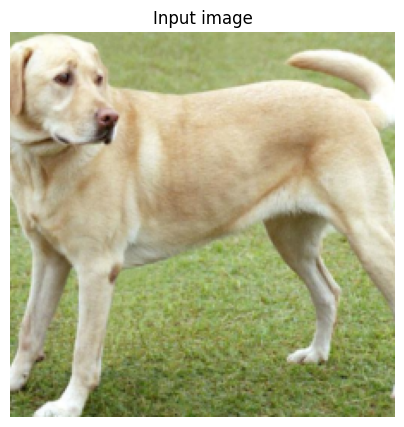

 1. Labrador retriever              prob=0.7066  class_id=208
 2. golden retriever                prob=0.0498  class_id=207
 3. Saluki                          prob=0.0448  class_id=176
 4. Chesapeake Bay retriever        prob=0.0393  class_id=209
 5. bull mastiff                    prob=0.0260  class_id=243


In [9]:
img = load_image('notebook_images/YellowLabradorLooking_new.jpg')

x = pil_to_tensor(img)

show_image_tensor(x, title='Input image')
preds = predict_topk(model, x, k=5)
print_topk(preds)

target_idx = preds[0][0]
target_name = preds[0][1]


## Activation Maximization

So far we have looked at how a trained network responds to a given input. Activation maximization turns this around and asks the opposite question: **what kind of input would make a particular neuron or class score as large as possible?** Instead of passing in a real image, we start from random noise and iteratively modify the pixels to maximize a chosen internal objective.

In this notebook we explore two types of objectives:
- a **class objective**, where we maximize the logit of a particular ImageNet class (e.g. “Egyptian cat”);
- a **channel objective**, where we maximize the average activation of one channel in a chosen block (e.g. `block4 / channel 37`) that we know is important for our example image.

The procedure is a form of regularized gradient ascent. We initialize an image with random values, feed it through the network, and compute the objective (class logit or channel mean). We then compute the gradient of this objective with respect to the input pixels and take a small step in the direction that increases it. To avoid pathological, high-frequency patterns, we add simple priors: a total-variation penalty to encourage smoothness, an $ \ell_2 $ penalty to keep pixel values bounded, small random jitters to promote translation invariance, and optional Gaussian blurring. We also run this process at multiple image scales (“octaves”), gradually increasing the resolution so that large structures emerge before fine details.

The resulting synthetic images are not meant to be photorealistic; rather, they reveal **what visual patterns the network finds highly activating** for a class or channel. Some look surprisingly interpretable (fur textures, eye-like structures, radial patterns), others remain abstract. Together with hotspot maps and occlusion sensitivity, these visualizations help connect the learned internal features of the model to both its global preferences and its behaviour on specific inputs.

### Regularization functions to compute the activation maximization map

Before we optimize an input image, we introduce a few simple priors that push the optimization toward human-interpretable patterns instead of pure noise. These are implemented as small helper functions:

- **Random initialization**: `random_init_image(...)` creates a random starting image in pixel space, then normalizes it with the same ImageNet statistics used for the model. Starting from noise rather than a real image prevents the optimization from merely refining an existing picture and lets us see **what the network naturally grows out of randomness** when asked to maximize a class or channel.

- **Total variation (TV) penalty**: `total_variation(x)` measures how quickly pixel values change across space. Large TV means a lot of high-frequency variation (speckle noise, sharp pixel-to-pixel jumps). By adding TV to the loss, we penalize such rapid changes and encourage **spatial smoothness**, so the synthesized images form coherent structures rather than pointillistic noise.

- **Jitter**: `jitter(x, max_jitter)` randomly shifts the image by a few pixels horizontally and vertically before each gradient step, then shifts it back implicitly when we update the underlying tensor. This simple trick promotes **translation invariance**: instead of overfitting to one exact alignment of features on the pixel grid, the optimization must find patterns that remain activating even when slightly moved.


Together, these ingredients act as regularizers for activation maximization: TV encourages smoothness, jitter reduces grid artifacts, and random initialization ensures we are exploring the network’s preferences rather than just retouching a particular image.

Beyond these simple priors, the feature‑visualization literature explores many other tricks to further improve the quality and interpretability of activation maximization images. For example, Olah, Mordvintsev, and Schubert discuss optimizing in alternative parameterizations such as Fourier space instead of raw pixels and using additional frequency‑based penalties or preconditioning to steer the spectrum of the solution.  

Nguyen, Yosinski, and Clune (and later collaborators) explore more expressive objectives and the use of learned generative priors (autoencoders, GANs, diffusion models) as image models rather than relying purely on hand‑crafted regularizers. These techniques can yield sharper and more natural‑looking visualizations, but they also add complexity and hyperparameters; in this notebook we deliberately stick to the simplest, widely used ingredients—random initialization, TV, and jitter—that already capture the main ideas behind activation maximization. 

**References**:

Olah, C., Mordvintsev, A., & Schubert, L. (2017), *Feature Visualization*, Distill, 2(11), ([WEB](https://distill.pub/2017/feature-visualization/)).

Nguyen, A., Yosinski, J., & Clune, J. (2016), *Multifaceted Feature Visualization: Uncovering the Different Types of Features Learned by Each Neuron in Deep Neural Networks*, ([PDF](https://arxiv.org/abs/1602.03616)) 

In [10]:
def random_init_image(shape=(1, 3, 224, 224), value_range=(0.0, 1.0), device=device):
    lo, hi = value_range
    x = torch.empty(shape, device=device).uniform_(lo, hi)
    x = (x - imagenet_mean) / imagenet_std
    x.requires_grad_(True)
    return x

def total_variation(x):
    tv_h = (x[:, :, 1:, :] - x[:, :, :-1, :]).abs().mean()
    tv_w = (x[:, :, :, 1:] - x[:, :, :, :-1]).abs().mean()
    return tv_h + tv_w

def jitter(x, max_jitter=8):
    if max_jitter <= 0:
        return x
    ox = np.random.randint(-max_jitter, max_jitter + 1)
    oy = np.random.randint(-max_jitter, max_jitter + 1)
    return torch.roll(x, shifts=(ox, oy), dims=(2, 3))

> **Sidebar: how jitter gradients “shift back”**

To see how gradients propagate through the jitter, it helps to look at a tiny 1D toy example where we can write everything out explicitly.

Consider a base tensor  
$x = [x_0, x_1, x_2, x_3]$  
and a left roll by 1:  
$x_j = \mathrm{roll}(x, -1) = [x_1, x_2, x_3, x_0].$

So each element in the jittered view comes from a different position in the base tensor:
- `x_j[0]` came from `x[1]`
- `x_j[1]` came from `x[2]`
- `x_j[2]` came from `x[3]`
- `x_j[3]` came from `x[0]`.

Now we run the model on $x_j$, get a scalar loss $L$, and backprop gives us a gradient with respect to the *shifted* tensor:  
$g_j = \frac{\partial L}{\partial x_j} = [g_0, g_1, g_2, g_3].$

Autograd must convert this into a gradient for the base tensor $x$. It simply routes each gradient entry back to where the corresponding value came from:

- Since `x_j[0] = x[1]`, gradient for `x[1]` gets $g_0$.
- Since `x_j[1] = x[2]`, gradient for `x[2]$ gets $g_1$.
- Since `x_j[2] = x[3]`, gradient for `x[3]$ gets $g_2$.
- Since `x_j[3] = x[0]`, gradient for `x[0]$ gets $g_3$.

So the gradient on the base tensor is  
$\dfrac{\partial L}{\partial x} = [g_3, g_0, g_1, g_2],$  
which is exactly `roll(g_j, +1)`, i.e. a roll in the *opposite* direction.

In 2D the same idea applies: if the forward jitter rolls the image by $(-10, -10)$, then the backward pass routes the gradient at $(i, j)$ in the jittered image back to $(i+10, j+10)$ in the base tensor (with wrap-around). In code we never call an explicit “inverse roll”; PyTorch records the `torch.roll` in the computation graph and automatically applies the corresponding inverse shift when computing gradients, so the updates are always applied in the correct coordinates of the underlying image. 

> **Sidebar: Total variation (TV)** is a measurement of how much neighboring pixels differ across the image. In the discrete form used here, it computes the average absolute difference between vertically adjacent pixels and horizontally adjacent pixels, so larger values indicate stronger local variation and smaller values indicate smoother, more piecewise-constant images. 

By itself, TV does not impose any preference; it is just a scalar summary of local pixel variation. It only becomes a regularizer when we add it to the optimization objective with a positive weight, for example through a term such as $+\lambda\,\mathrm{TV}(x)$ in the loss. 

Once included in the loss, minimizing that term penalizes rapid pixel-to-pixel oscillations and therefore biases the optimization toward smoother structures. An often‑observed property of TV‑based regularization is that it suppresses small high‑frequency noise while still allowing relatively sharp transitions, which is why it is often described as edge‑preserving rather than simply blur‑inducing. 

Classical first‑order TV regularization is known to introduce “staircasing”: smoothly varying regions can be turned into piecewise‑constant plateaus separated by artificial sharp edges, a blocky artifact that motivates many higher‑order TV variants. A common way to mitigate this is to replace plain TV by more sophisticated regularizers such as **Total Generalized Variation (TGV)**., introduced by Bredies, Kunisch, and Pock, which incorporates higher‑order derivative information so that smooth ramps are less penalized; TGV is widely used in imaging as a TV‑like, edge‑aware regularizer that substantially reduces staircasing. 

In activation maximization, this is useful because unconstrained gradient ascent often produces dense, high-frequency artifacts that strongly excite the network but are hard for humans to interpret. Adding a weighted TV term does not “detect contours”; instead, it measures local variation and, through the loss, discourages unnecessary oscillation so that larger coherent shapes and textures can emerge. 

**Reference**: 

Bredies, K., Kunisch, K., & Pock, T. (2010), *Total Generalized Variation*, SIAM Journal on Imaging Sciences, 3(3), ([PDF](https://static.uni-graz.at/fileadmin/_files/_homepages/_karl_kunisch/Papers/224_KK.pdf))

### Defining objectives 

To perform activation maximization we first need to define **what** we want the image to maximize. Here we use two simple scalar objectives. The first, `class_objective`, takes the model’s logits and returns the mean score for a chosen class index; maximizing this pushes the image to look like something the network strongly associates with that class. The second, `channel_objective`, operates on a chosen intermediate feature map and returns the mean activation of a single channel in a given layer; maximizing this reveals what visual pattern most strongly excites that particular feature channel.

In [11]:
def class_objective(model, x, class_idx):
    logits = model(x)
    return logits[:, class_idx].mean()

def channel_objective(feature_extractor, x, layer_name, channel_idx):
    feats = feature_extractor(x)
    fmap = feats[layer_name]
    return fmap[:, channel_idx].mean()

### The main loop

With the objectives in place, we can now optimize an input image by gradient ascent. At each iteration we start from the current image, apply a small random spatial shift using `jitter`, run the shifted image through the network, and evaluate either the class or channel objective. We then form a total loss that **rewards** the objective but **penalizes** both the total variation `total_variation(x)` and an $\ell_2$ norm on the image (to keep pixel values bounded), backpropagate this loss to obtain the gradient with respect to the input pixels, and update the image in the direction that increases the objective while controlling TV and overall energy. After many such steps, the image converges to a pattern that strongly activates the selected unit or class, subject to the smoothness, translation‑invariance, and magnitude priors introduced by TV, jitter, and the $\ell_2$ penalty.

Concretely, if we write the class or channel objective as $J(x)$, the loss we minimize can be written as
$$
\mathcal{L}(x) = - J(x) + \lambda_{\mathrm{TV}} \,\mathrm{TV}(x) + \lambda_2 \,\|x\|_2^2,
$$
where $\lambda_{\mathrm{TV}}$ and $\lambda_2$ control the strength of the total variation and $\ell_2$ penalties. 

In [12]:
def optimize_input_with_octaves(
    objective_fn,
    base_shape=(1, 3, 224, 224),
    octave_scales=(0.5, 0.75, 1.25),
    steps_per_octave=80,
    lr=0.08,
    tv_weight=1e-2,
    l2_weight=1e-4,
    jitter_strength=8,
    blur_every=0,        # ignored except possibly in last octave
    blur_radius=0.5,
    verbose=False,
):
    """
    Multi-scale (octave) activation maximization.

    - objective_fn: function taking a normalized tensor x and returning a scalar.
    - base_shape: reference (B,C,H,W); scales are applied to H,W.
    - octave_scales: relative scales (e.g., 0.5, 0.75, 1.25).
      The last value controls the final resolution.
    """
    base_B, base_C, base_H, base_W = base_shape
    device = imagenet_mean.device

    # Start from random image at smallest scale
    min_scale = min(octave_scales)
    init_H = int(round(base_H * min_scale))
    init_W = int(round(base_W * min_scale))
    x = random_init_image(shape=(base_B, base_C, init_H, init_W), device=device)

    history = []

    for o_idx, scale in enumerate(octave_scales):
        target_H = int(round(base_H * scale))
        target_W = int(round(base_W * scale))

        # Resize x to current octave resolution (in normalized space)
        if (x.shape[-2], x.shape[-1]) != (target_H, target_W):
            with torch.no_grad():
                img = denormalize(x).clamp(0, 1)
                img = F.interpolate(img, size=(target_H, target_W),
                                    mode="bilinear", align_corners=False)
                x = ((img - imagenet_mean) / imagenet_std).detach()
                x.requires_grad_(True)

        optimizer = torch.optim.Adam([x], lr=lr)

        if verbose:
            print(f"\n=== Octave {o_idx+1}/{len(octave_scales)} "
                  f"scale={scale:.2f} size={target_H}x{target_W} ===")

        # Only apply blur on the **last** octave if blur_every > 0
        apply_blur = (o_idx == len(octave_scales) - 1) and (blur_every > 0)

        for step in range(steps_per_octave):
            optimizer.zero_grad()

            x_in = jitter(x, max_jitter=jitter_strength)
            obj = objective_fn(x_in)

            tv = total_variation(x)
            l2 = (x ** 2).mean()

            loss = -obj + tv_weight * tv + l2_weight * l2
            loss.backward()
            optimizer.step()

            with torch.no_grad():
                img = denormalize(x).clamp(0, 1)
                x.copy_((img - imagenet_mean) / imagenet_std)

            if apply_blur and (step + 1) % blur_every == 0:
                with torch.no_grad():
                    # work entirely at current resolution
                    img = denormalize(x).clamp(0, 1)  # [1,3,H,W]
                    img_np = img.squeeze(0).permute(1, 2, 0).cpu().numpy()
                    pil = Image.fromarray((img_np * 255).astype(np.uint8))
                    pil = pil.filter(ImageFilter.GaussianBlur(radius=blur_radius))

                    curr_H, curr_W = x.shape[-2], x.shape[-1]
                    pil = pil.resize((curr_W, curr_H), Image.BILINEAR)

                    xb = torch.from_numpy(np.array(pil)).float() / 255.0
                    xb = xb.permute(2, 0, 1).unsqueeze(0).to(device)
                    xb = (xb - imagenet_mean) / imagenet_std
                    x.copy_(xb)

            history.append(float(obj.detach().cpu()))

            if verbose and ((step + 1) % 50 == 0 or step == 0):
                print(f"[octave {o_idx+1}] step={step+1:03d} obj={history[-1]:.4f}")

    # No final resize: keep the last octave's resolution as-is
    return x.detach(), history

### Creating the Activation Maximization Map for the class

In this step we run the full optimization loop to synthesize an image that maximizes the score of our target class.


=== Octave 1/4 scale=0.60 size=134x134 ===
[octave 1] step=001 obj=-2.0337
[octave 1] step=050 obj=20.4573
[octave 1] step=100 obj=30.5407
[octave 1] step=150 obj=46.3078
[octave 1] step=200 obj=58.2325

=== Octave 2/4 scale=0.80 size=179x179 ===
[octave 2] step=001 obj=25.9190
[octave 2] step=050 obj=74.5419
[octave 2] step=100 obj=93.4933
[octave 2] step=150 obj=100.8626
[octave 2] step=200 obj=102.8870

=== Octave 3/4 scale=1.00 size=224x224 ===
[octave 3] step=001 obj=58.0854
[octave 3] step=050 obj=98.6887
[octave 3] step=100 obj=125.7625
[octave 3] step=150 obj=129.6748
[octave 3] step=200 obj=135.4107

=== Octave 4/4 scale=1.20 size=269x269 ===
[octave 4] step=001 obj=56.0914
[octave 4] step=050 obj=96.2425
[octave 4] step=100 obj=104.2951
[octave 4] step=150 obj=102.1577
[octave 4] step=200 obj=119.3880


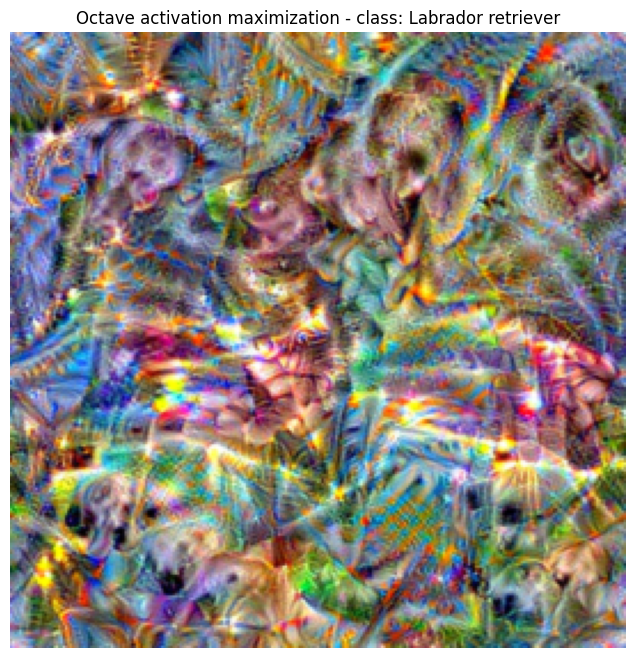

In [13]:
def maximize_class_octaves(class_idx, **kwargs):
    return optimize_input_with_octaves(
        lambda x: class_objective(model, x, class_idx),
        **kwargs,
    )

x_opt, hist = maximize_class_octaves(
    target_idx,
    octave_scales=(0.6,0.8, 1, 1.2),
    #octave_scales=(0.5, 0.75, 1.4), 
    steps_per_octave=200,
    lr=0.08,
    tv_weight=1e-2,
    l2_weight=1e-4,
    jitter_strength=8,
    blur_every=20,
    blur_radius=0.5,
    verbose=True,
)

show_image_tensor(x_opt, title=f'Octave activation maximization - class: {target_name}', figsize=(8,8))

#### Sanity check

As a sanity check, we feed the optimized image back into the model and look at the top‑5 predictions. The most probable class should match our target (e.g. Labrador retriever) with very high probability.

In [14]:
preds = predict_topk(model, x_opt, k=5)
print_topk(preds)

 1. Labrador retriever              prob=1.0000  class_id=208
 2. Chesapeake Bay retriever        prob=0.0000  class_id=209
 3. flat-coated retriever           prob=0.0000  class_id=205
 4. curly-coated retriever          prob=0.0000  class_id=206
 5. golden retriever                prob=0.0000  class_id=207


### Creating the Activation Maximization Map for a channel in a select layer

Here we repeat the optimization, but now the objective is the mean activation of a single feature channel in a chosen intermediate layer. 

The resulting optimized image reveals what kind of pattern most strongly excites that specific channel, giving a more localized view of the internal features the network has learned in that layer.

When exploring different blocks, it is helpful to keep the feature hierarchy of the network in mind. Early blocks typically respond to very simple, low‑level structures such as edges, color contrasts, or Gabor‑like textures; their activation maximization maps often look like oriented stripes or basic texture patterns. Deeper blocks combine these into more complex motifs and object parts (fur and eyes, wheels, faces), and in the last block the synthesized patterns can resemble whole object templates or class‑specific textures.

By scanning through channels across the four blocks, you can see this progression from local, generic features towards more abstract and class‑specific ones, closely mirroring the classical picture of Gabor‑like edge detectors in early visual cortex and more complex receptive fields in higher areas.

In [15]:
def maximize_channel_octaves(layer_name, channel_idx, **kwargs):
    return optimize_input_with_octaves(
        lambda x: channel_objective(feature_extractor, x, layer_name, channel_idx),
        **kwargs,
    )

def top_channels_for_image(x, layer_name="block4", k=3, mode="mean"):
    """
    Returns indices of the k channels in layer_name with highest
    average activation for this specific input x.
    """
    feats = get_features(x)                        # dict[layer -> (B,C,H,W)]
    fmap = feats[layer_name][0]                    # (C,H,W)
    if mode == "mean":
        scores = fmap.mean(dim=(1, 2))             # (C,)
    elif mode == "max":
        scores = fmap.max(dim=1).values.max(dim=1).values  # (C,)
    elif mode == "l2":
        scores = torch.sqrt((fmap ** 2).sum(dim=(1, 2)) + 1e-8)
    else:
        raise ValueError("mode must be mean, max, or l2")
    vals, idxs = scores.topk(k)
    return idxs.cpu().tolist(), vals.cpu().tolist()

Top channels in block4 for this image: [(429, 16.866525650024414), (9, 14.405494689941406), (127, 13.47684383392334)]


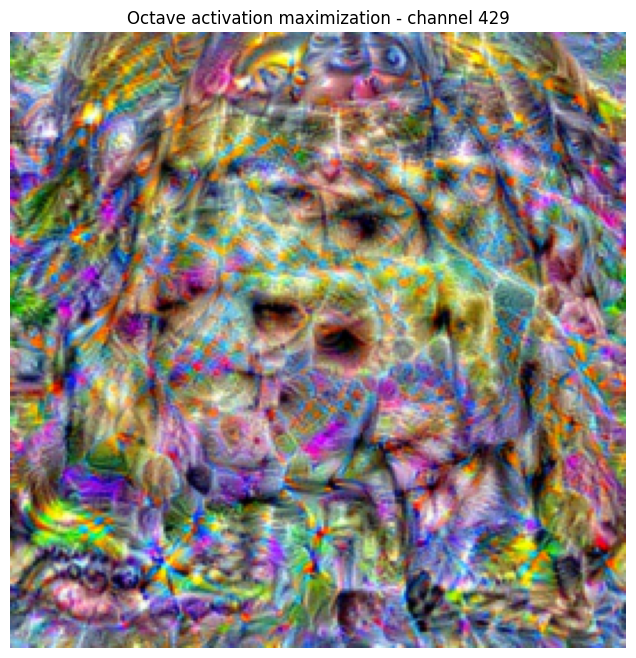

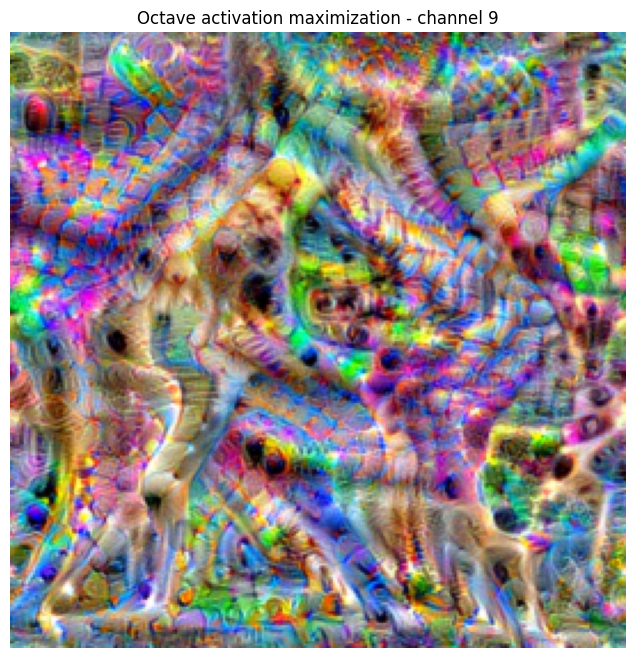

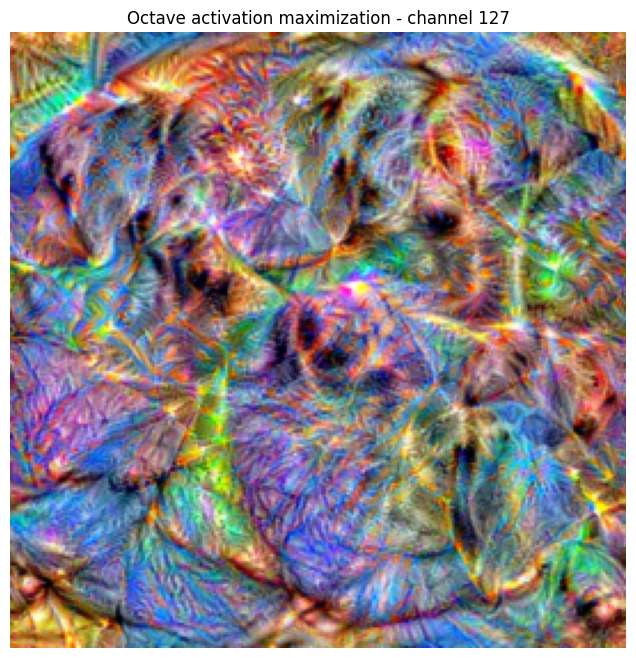

In [16]:
block = 'block4'
k = 3
top_idxs, top_vals = top_channels_for_image(x, layer_name=block, k=k, mode="max")
print(f'Top channels in {block} for this image:', list(zip(top_idxs, top_vals)))

results = []
for ch in top_idxs:
    x_opt_ch, hist_ch = maximize_channel_octaves(
        block,
        channel_idx=ch,
        octave_scales=(0.6,0.8, 1, 1.2),
        steps_per_octave=200,
        lr=0.08,
        tv_weight=1e-2,
        l2_weight=1e-4,
        jitter_strength=8,
        blur_every=20,
        blur_radius=0.5,
        verbose=False,
    )
    show_image_tensor(x_opt_ch, title=f'Octave activation maximization - channel {ch}', figsize=(8,8))


## Hotspot maps

Hotspot maps provide a simple activation-based view of the model’s internal response to an input image. To build them, we first extract the intermediate activations from selected layers of the network, typically at the end of major convolutional blocks. For a given input image, each of these layers produces a tensor with many channels, where each channel is a **feature map** indicating how strongly one learned pattern is present across spatial locations.

A single layer may contain dozens or hundreds of feature maps, so instead of inspecting each one individually we aggregate them into a single spatial map. In this notebook we use simple channel-wise reductions such as the mean, maximum, or $\ell_2$-norm to summarize where the layer, as a whole, responds most strongly. After upsampling this map to the original image resolution, we overlay it on the input image to highlight the regions that most strongly activate that layer.

Hotspot maps are useful because they give an intuitive picture of where the network is internally active, but they should not be interpreted as direct explanations of the final prediction. They are **not class-specific**: a region may strongly activate an intermediate layer without being the main reason why the model predicts a particular class.

### Auxiliary functions to process and visualize the maps

In [17]:
def normalize_map(m):
    m = m - m.min()
    if m.max() > 0:
        m = m / m.max()
    return m

def aggregate_feature_map(feat, mode="mean"):
    if mode == "mean":
        amap = feat.mean(dim=1, keepdim=True)
    elif mode == "max":
        amap = feat.max(dim=1, keepdim=True).values
    elif mode == "l2":
        amap = torch.sqrt((feat ** 2).sum(dim=1, keepdim=True) + 1e-8)
    else:
        raise ValueError("mode must be one of: mean, max, l2")
    return amap

def upsample_map(amap, target_hw):
    return F.interpolate(amap, size=target_hw, mode="bilinear", align_corners=False)


def show_feature_grid(feat, n=16, title=None, cols=4, figsize=(8, 8)):
    feat = feat[0].detach().cpu()
    n = min(n, feat.shape[0])
    rows = math.ceil(n / cols)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(rows, cols, i + 1)
        fmap = feat[i]
        fmap = (fmap - fmap.min()) / (fmap.max() - fmap.min() + 1e-8)
        plt.imshow(fmap, cmap="jet")
        plt.axis("off")
    if title is not None:
        plt.suptitle(title)
    plt.tight_layout()
    plt.show()

In [18]:
def show_feature_rows(
    feats,
    layer_order=None,
    n_channels=8,
    cmap="viridis",
    figsize_per_cell=2.0,
):
    """
    Visualize feature maps from multiple layers as rows, with a text label
    on the left of each row indicating the block/layer name.
    """
    if layer_order is None:
        layer_order = list(feats.keys())

    rows = len(layer_order)
    cols = n_channels

    fig, axes = plt.subplots(
        rows,
        cols,
        figsize=(figsize_per_cell * cols, figsize_per_cell * rows),
        squeeze=False,
    )

    for row, lname in enumerate(layer_order):
        fmap = feats[lname][0].detach().cpu()   # (C, H, W)
        C = fmap.shape[0]
        k = min(n_channels, C)

        for col in range(cols):
            ax = axes[row, col]
            if col < k:
                ch = fmap[col]
                ch = (ch - ch.min()) / (ch.max() - ch.min() + 1e-8)
                ax.imshow(ch, cmap=cmap)
            ax.axis("off")

        # Add a row label in figure coordinates, left of the row
        # y-position is centered for this row; x is slightly left of first column
        y_center = (rows - row - 0.5) / rows
        fig.text(
            0.03,               # small left margin
            y_center,
            lname,
            va="center",
            ha="left",
            rotation=90,
            fontsize=10,
        )

    plt.tight_layout(rect=(0.05, 0.0, 1.0, 1.0))  # leave room at left for labels
    plt.show()

### Exploring individual feature maps

When we visualize activations from an early convolutional layer, it is tempting to say that the layer is already “seeing a dog”. That is not quite right. Early layers respond mostly to **local patterns** such as edges, color contrasts, and simple textures: they fire wherever those patterns appear in the image, regardless of what object is present. This behaviour emerges from having small receptive fields and learned convolutional filters that act like oriented edge and texture detectors.

As we move deeper into the network, the feature maps change in two ways. First, their **spatial resolution decreases** due to pooling and striding, so each unit covers a larger region of the original image. Second, the **number and specificity of channels increase**: deeper channels respond to more complex motifs such as parts of objects or characteristic textures (fur, eyes, background patterns). By scrolling through feature maps at different depths, we can see how the model gradually transforms raw pixels into higher-level, more abstract representations.

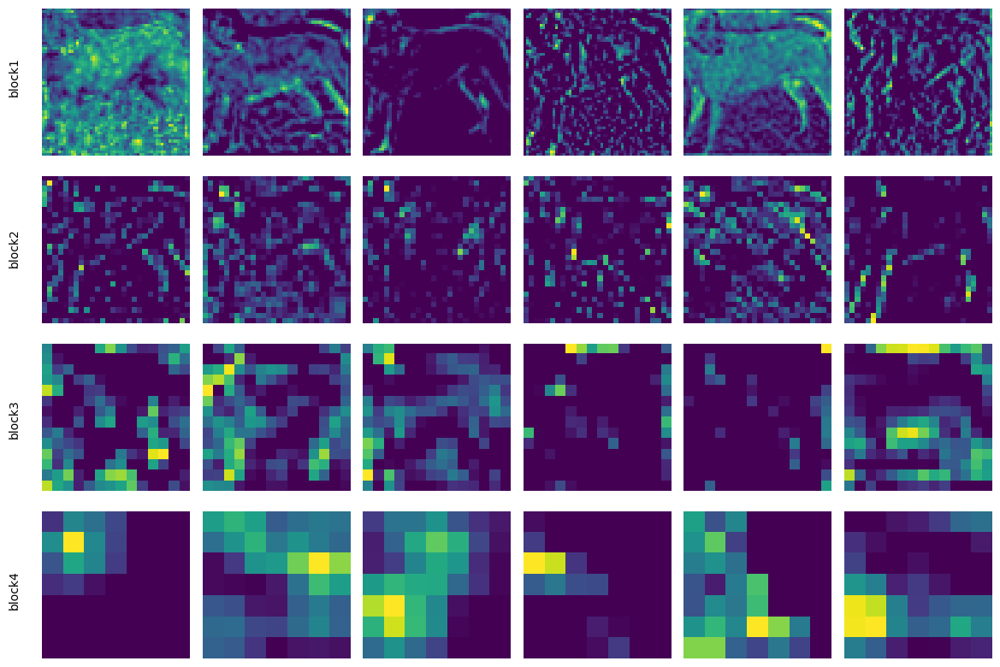

In [19]:
feats = get_features(x)

show_feature_rows(
    feats,
    layer_order=["block1", "block2", "block3", "block4"],
    n_channels=6,
)

In [20]:
def _compute_hotspot_core(feats, layer_name, target_hw, mode="mean", normalize = True):
    fmap = feats[layer_name]
    amap = aggregate_feature_map(fmap, mode=mode)
    amap = upsample_map(amap, target_hw)
    if normalize:
        amap = normalize_map(amap)
    return amap


def compute_hotspot_maps(
    x,
    layer_names=("block1", "block2", "block3", "block4"),
    mode="mean",
    normalize = True
):
    feats = get_features(x)
    H, W = x.shape[-2:]
    hotspots = {}
    for lname in layer_names:
        hotspots[lname] = _compute_hotspot_core(feats, lname, (H, W), mode=mode, normalize = normalize)
    return hotspots


def compute_hotspot_map(x, layer_name="block4", mode="mean", normalize = True):
    feats = get_features(x)
    H, W = x.shape[-2:]
    return _compute_hotspot_core(feats, layer_name, (H, W), mode=mode, normalize = normalize)

Create an overlay for display purposes

In [21]:
def overlay_heatmap_on_image(
    ax,
    x,
    heatmap,
    alpha=0.45,
    cmap="jet",
    title=None,
):
    """Draw a single heatmap overlay into an existing Axes."""
    img = tensor_to_image(x)
    hm = heatmap.squeeze().detach().cpu().numpy()
    hm = (hm - hm.min()) / (hm.max() - hm.min() + 1e-8)

    ax.imshow(img)
    ax.imshow(hm, cmap=cmap, alpha=alpha)
    ax.axis("off")
    if title is not None:
        ax.set_title(title)


def visualize_hotspots(
    x,
    hotspots,
    alpha=0.45,
    cmap="jet",
    figsize_per_map=4.0,
):
    """
    Visualize all hotspot maps in a single row.

    hotspots: dict[layer_name -> heatmap tensor]
    """
    layer_names = list(hotspots.keys())
    n = len(layer_names)

    # width scales with number of maps, height fixed
    fig, axes = plt.subplots(
        1,
        n,
        figsize=(figsize_per_map * n, figsize_per_map),
        squeeze=False,
    )
    axes = axes[0]  # 1D array

    for ax, lname in zip(axes, layer_names):
        amap = hotspots[lname]
        overlay_heatmap_on_image(
            ax,
            x,
            amap,
            alpha=alpha,
            cmap=cmap,
            title=f"{lname} hotspot",
        )

    plt.tight_layout()
    plt.show()

### Combining feature maps into hotspot maps

Looking at individual feature maps can be instructive, but it quickly becomes overwhelming: each block produces tens or hundreds of channels, many of which look noisy or hard to interpret on their own. This does not mean they are useless; it simply reflects the fact that deeper channels encode more abstract and specialized patterns than simple edges.

What does change systematically with depth is **how localized and how abstract** the activations become. In early blocks, many channels behave like edge or texture detectors and fire wherever local contrast or simple shapes appear, including along the padded border. Deeper blocks have larger receptive fields and their channels tend to respond to more structured motifs that span larger parts of the image. It is tempting to describe this as “block2 sees eyes and noses” or “block4 sees the whole dog”, but this is at best an approximation based on a few examples; we should be careful not to over-anthropomorphize these patterns.

To get a more manageable view of what each block emphasizes overall, we aggregate its feature maps into a single **hotspot map**. Concretely, for each block we reduce across channels (for example by taking the mean or maximum activation at each spatial location), upsample the result to the original image resolution, and optionally normalize it for visualization. The resulting map highlights where that block, as a whole, responds most strongly to the input. When we overlay these hotspot maps on top of the input image, we obtain an at-a-glance view of how the focus of the network shifts from low-level local structure in early blocks to more global, abstract structure in deeper ones.

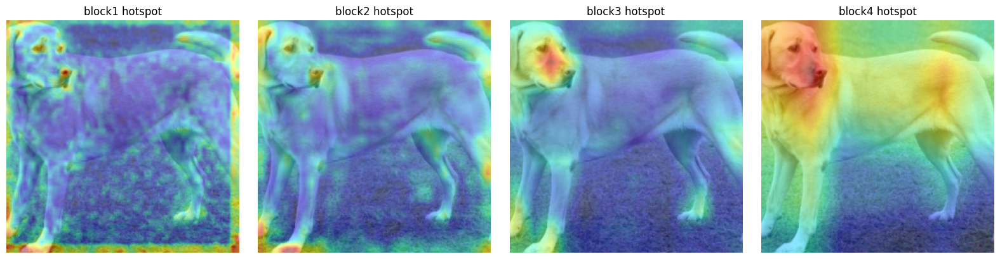

In [22]:
hotspots = compute_hotspot_maps(x, mode="mean")
visualize_hotspots(x, hotspots)

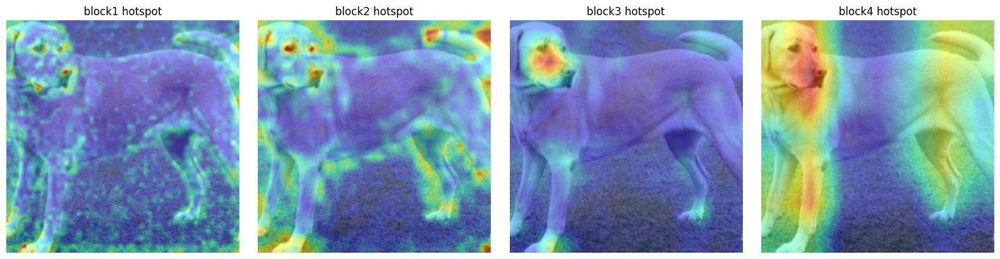

In [23]:
hotspots = compute_hotspot_maps(x, mode="max")
visualize_hotspots(x, hotspots)

## Occlusion maps

Occlusion sensitivity is a **perturbation-based attribution method**: instead of asking *where the network is active*, we ask *which spatial regions are causally important for a chosen class score*. The basic idea is to iteratively occlude small patches of the input image (for example by replacing them with a constant baseline value), recompute the model output, and measure how much the target logit changes. Patches whose removal causes a large drop in the target score are deemed important; patches whose removal has little effect are considered less relevant.

In this notebook we use Captum’s `Occlusion` module to automate this process. Given an input image and a target class index, Captum slides a window over the image with a specified stride, replaces each window with a baseline, and records the change in the target logit. We aggregate the resulting attribution tensor across channels and, for visualization, optionally normalize it to $[0, 1]$, and upsample it to the original resolution. Overlaying this map on the image yields an **occlusion map**: a coarse but directly causal heatmap showing which regions most support the chosen prediction.

Sliding‑window occlusion probes the effect of removing small patches under a particular baseline. It is sensitive to patch size, stride, and baseline choice, and it mainly captures local, additive effects. Long‑range interactions or more complex feature dependencies may not be visible in these maps. Furthermore, because an occlusion map requires running the model on a large number of perturbed inputs, it can be computationally expensive unless the window size, stride, and sampling strategy are chosen carefully.

In [24]:
occlusion = Occlusion(model)

def compute_occlusion_map(
    x,
    target,
    sliding_window_shapes=(3, 32, 32),
    strides=(3, 16, 16),
    baselines=0.0,
    normalize = True
):
    attributions = occlusion.attribute(
        x,
        target=target,
        strides=strides,
        sliding_window_shapes=sliding_window_shapes,
        baselines=baselines,
    )
    amap = attributions.abs().sum(dim=1, keepdim=True)
    if normalize:
        amap = normalize_map(amap)
    return amap

def visualize_occlusion(x, occlusion_map, alpha=0.45, cmap="jet", title=None, figsize=(5, 5)):
    fig, ax = plt.subplots(figsize=figsize)
    overlay_heatmap_on_image(ax, x, occlusion_map, alpha=alpha, cmap=cmap, title=title)
    plt.tight_layout()
    plt.show()

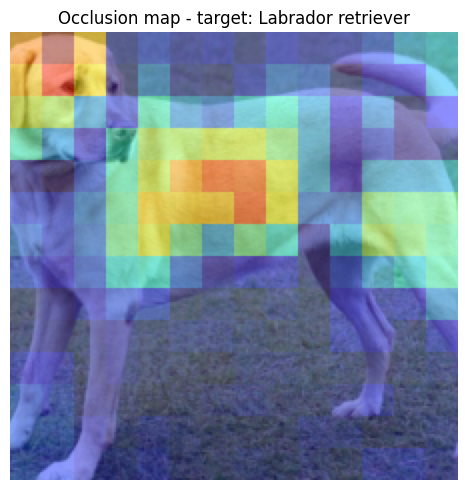

In [25]:
occ_map = compute_occlusion_map(
    x,
    target=target_idx,
    sliding_window_shapes=(3, 32, 32),
    strides=(3, 16, 16),
    baselines=0.0,
)

visualize_occlusion(x, occ_map, title=f'Occlusion map - target: {target_name}')

## Hotspot maps and occlusion sensitivity

We now compare two complementary ways of interpreting the model response on a clean image and on its adversarial counterpart.

- **Hotspot map:** an activation-based view built from an intermediate convolutional layer. It shows where the network responds strongly internally for the current forward pass.
- **Occlusion sensitivity:** a perturbation-based view. It shows which spatial regions matter most for a chosen class score, by masking image patches and measuring how the output changes.

These maps are not expected to be identical. In particular, on adversarial inputs the model may still activate strongly in some regions while the regions that causally support the output under perturbation shift elsewhere.

In this example we started with an image and crafted an adversarial example so that a tabby cat its classification is now a startfish.

![](notebook_images/adv_output_report.png)

Open the images and perform a sanity check

(224, 224)
torch.Size([1, 3, 224, 224])


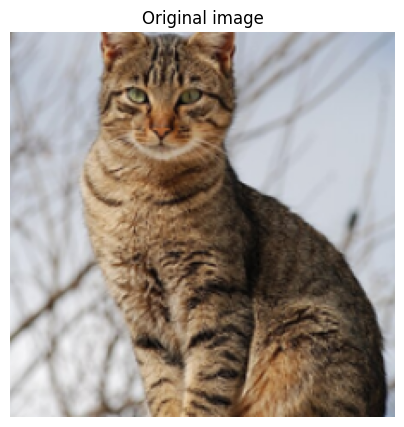

 1. tabby                           prob=0.4069  class_id=281
 2. Egyptian cat                    prob=0.3327  class_id=285
 3. tiger cat                       prob=0.2387  class_id=282
 4. lynx                            prob=0.0125  class_id=287
 5. plastic bag                     prob=0.0030  class_id=728


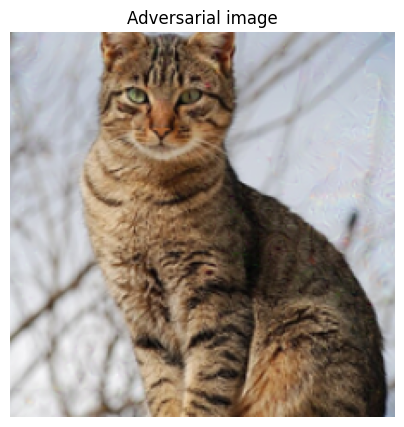

 1. starfish                        prob=1.0000  class_id=327
 2. sea slug                        prob=0.0000  class_id=115
 3. triceratops                     prob=0.0000  class_id=51
 4. sea cucumber                    prob=0.0000  class_id=329
 5. conch                           prob=0.0000  class_id=112


In [26]:
clean = load_image('notebook_images/cat_original.png')
print(clean.size)
clean_tensor = pil_to_tensor(clean)
print(clean_tensor.shape)
show_image_tensor(clean_tensor, title='Original image')
preds = predict_topk(model, clean_tensor, k=5)
print_topk(preds)

clean_idx = preds[0][0]
clean_name = preds[0][1]

adversarial = load_image('notebook_images/cat_adversarial.png')
#adversarial = load_image("output/pgdl2_results/adversarial.png")

adv_tensor = pil_to_tensor(adversarial)

show_image_tensor(adv_tensor, title='Adversarial image')
preds_adv = predict_topk(model, adv_tensor, k=5)
print_topk(preds_adv)

adv_idx = preds_adv[0][0]
adv_name = preds_adv[0][1]


Aux functions to plot the maps

In [27]:
from matplotlib.colors import TwoSlopeNorm

def plot_hotspot_occlusion_comparison(
    clean_img,
    adv_img,
    hot_clean_raw,
    hot_adv_raw,
    occ_clean_raw,
    occ_adv_raw,
    clean_pred,
    adv_pred,
    alpha=0.45,
    overlay_cmap="jet",
    diff_cmap="RdBu_r",
    diff_percentile=99,
    figsize=(16, 8),
):
    def to_numpy_map(m):
        if isinstance(m, torch.Tensor):
            m = m.detach().cpu().squeeze().numpy()
        return np.asarray(m, dtype=np.float32)

    def normalize_individual(m, eps=1e-8):
        m = to_numpy_map(m)
        lo, hi = m.min(), m.max()
        if hi - lo < eps:
            return np.zeros_like(m)
        return (m - lo) / (hi - lo)

    def normalize_pair_shared(a, b, eps=1e-8):
        a = to_numpy_map(a)
        b = to_numpy_map(b)
        lo = min(a.min(), b.min())
        hi = max(a.max(), b.max())
        if hi - lo < eps:
            return np.zeros_like(a), np.zeros_like(b)
        return (a - lo) / (hi - lo), (b - lo) / (hi - lo)

    def robust_diff_norm(diff, percentile=99):
        vmax = np.percentile(np.abs(diff), percentile)
        vmax = max(float(vmax), 1e-8)
        return TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)

    clean_np = tensor_to_image(clean_img)
    adv_np = tensor_to_image(adv_img)

    # Individually normalized versions for display overlays
    hot_clean_vis = normalize_individual(hot_clean_raw)
    occ_clean_vis = normalize_individual(occ_clean_raw)
    hot_adv_vis   = normalize_individual(hot_adv_raw)
    occ_adv_vis   = normalize_individual(occ_adv_raw)

    # Shared normalization within each row for meaningful differences
    hot_clean_cmp, occ_clean_cmp = normalize_pair_shared(hot_clean_raw, occ_clean_raw)
    hot_adv_cmp, occ_adv_cmp     = normalize_pair_shared(hot_adv_raw, occ_adv_raw)

    diff_clean = hot_clean_cmp - occ_clean_cmp
    diff_adv   = hot_adv_cmp - occ_adv_cmp

    norm_clean = robust_diff_norm(diff_clean, percentile=diff_percentile)
    norm_adv   = robust_diff_norm(diff_adv, percentile=diff_percentile)

    fig, axes = plt.subplots(2, 4, figsize=figsize)

    # Row 1: clean
    axes[0, 0].imshow(clean_np)
    axes[0, 0].set_title(f"Clean image\npred = {clean_pred}")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(clean_np)
    axes[0, 1].imshow(hot_clean_vis, cmap=overlay_cmap, alpha=alpha, vmin=0, vmax=1)
    axes[0, 1].set_title("Clean hotspot")
    axes[0, 1].axis("off")

    axes[0, 2].imshow(clean_np)
    axes[0, 2].imshow(occ_clean_vis, cmap=overlay_cmap, alpha=alpha, vmin=0, vmax=1)
    axes[0, 2].set_title("Clean occlusion")
    axes[0, 2].axis("off")

    im_clean = axes[0, 3].imshow(diff_clean, cmap=diff_cmap, norm=norm_clean)
    axes[0, 3].set_title("Clean difference\n(hotspot - occlusion)")
    axes[0, 3].axis("off")

    # Row 2: adversarial
    axes[1, 0].imshow(adv_np)
    axes[1, 0].set_title(f"Adversarial image\npred = {adv_pred}")
    axes[1, 0].axis("off")

    axes[1, 1].imshow(adv_np)
    axes[1, 1].imshow(hot_adv_vis, cmap=overlay_cmap, alpha=alpha, vmin=0, vmax=1)
    axes[1, 1].set_title("Adversarial hotspot")
    axes[1, 1].axis("off")

    axes[1, 2].imshow(adv_np)
    axes[1, 2].imshow(occ_adv_vis, cmap=overlay_cmap, alpha=alpha, vmin=0, vmax=1)
    axes[1, 2].set_title("Adversarial occlusion")
    axes[1, 2].axis("off")

    im_adv = axes[1, 3].imshow(diff_adv, cmap=diff_cmap, norm=norm_adv)
    axes[1, 3].set_title("Adversarial difference\n(hotspot - occlusion)")
    axes[1, 3].axis("off")

    cbar1 = fig.colorbar(im_clean, ax=axes[0, 3], fraction=0.046, pad=0.04)
    cbar1.set_label("Signed difference")

    cbar2 = fig.colorbar(im_adv, ax=axes[1, 3], fraction=0.046, pad=0.04)
    cbar2.set_label("Signed difference")

    plt.tight_layout()
    plt.show()

    
def plot_two_occlusion_maps(
    clean_img,
    adv_img,
    clean_target,
    adv_target,
    clean_title,
    adv_title,
    alpha=0.45,
    cmap="jet",
    figsize=(10, 4),
):
    occ_clean = compute_occlusion_map(clean_img, target=clean_target).to("cpu")
    occ_adv = compute_occlusion_map(adv_img, target=adv_target).to("cpu")

    clean_np = tensor_to_image(clean_img)
    adv_np = tensor_to_image(adv_img)

    occ_clean_np = occ_clean.squeeze().detach().cpu().numpy()
    occ_adv_np = occ_adv.squeeze().detach().cpu().numpy()

    fig, axes = plt.subplots(1, 2, figsize=figsize)

    axes[0].imshow(clean_np)
    axes[0].imshow(occ_clean_np, cmap=cmap, alpha=alpha)
    axes[0].set_title(clean_title)
    axes[0].axis("off")

    axes[1].imshow(adv_np)
    axes[1].imshow(occ_adv_np, cmap=cmap, alpha=alpha)
    axes[1].set_title(adv_title)
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()    

### Testing differences with adversarial sample

As a sanity check, we compare hotspot and occlusion maps on a clean image and on its adversarial counterpart. For the clean example, both views concentrate on the cat, with the head and torso carrying most of the signal. 

In this particular adversarial example, both the hotspot map and the occlusion map clearly shift away from the cat’s head and torso and toward the background patch, indicating that the attack has redirected the model’s internal evidence toward the spurious texture it exploits. This clear shift is not guaranteed for all adversarial examples; in other cases the attribution changes can be more subtle or distributed, but here it provides a clean, visually interpretable illustration of how an attack can both flip the label and rearrange where the model ‘looks’ for evidence..

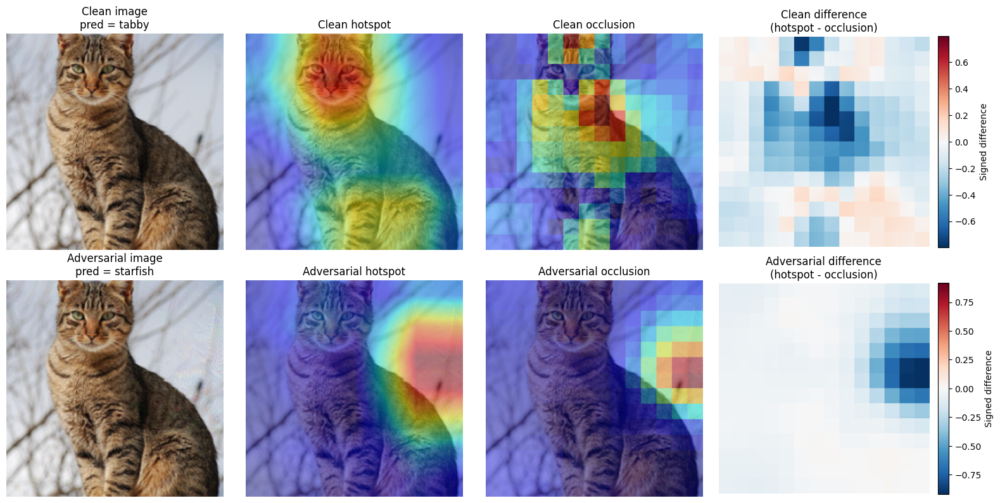

In [28]:
#clean_img = x
#adv_img = adversarial.clamp(0, 1)

hot_clean = compute_hotspot_map(clean_tensor, normalize=False).to('cpu')
hot_adv = compute_hotspot_map(adv_tensor, normalize=False).to('cpu')

occ_clean = compute_occlusion_map(clean_tensor, target=clean_idx, normalize=False).to('cpu')
occ_adv = compute_occlusion_map(adv_tensor, target=adv_idx, normalize=False).to('cpu')


plot_hotspot_occlusion_comparison(
    clean_tensor, adv_tensor,
    hot_clean, hot_adv,
    occ_clean, occ_adv,
    class_names[clean_idx], class_names[adv_idx])

### Interpreting the “difference = hotspot − occlusion” 

This is a disagreement map between what the network finds exciting and what is actually causal (per your occlusion probe) for the chosen class.

More concretely:

* Hotspot map: “Where in the image does some intermediate feature block activate strongly for this input?”

* Occlusion map: “Where in the image does masking cause the class score to drop the most?”

* Difference (red–blue map): “Where are these two stories misaligned?”

So:

* Red areas (hotspot > occlusion): places the backbone is very “interested” (high activation) but the occlusion test says they are not particularly important for the class score. These are spurious or unused excitations for that class: the network lights up there but the classifier could largely ignore them when making the decision.

* Blue areas (occlusion > hotspot): places where occlusion claims high importance but the hotspot is weaker. These are regions where importance is mediated more globally (e.g., via later layers or distributed features) than what your chosen feature map highlights.

These difference maps are best interpreted within each image as spatial disagreement maps; they do not, by themselves, support strong quantitative claims about disagreement being larger or smaller between clean and adversarial cases.

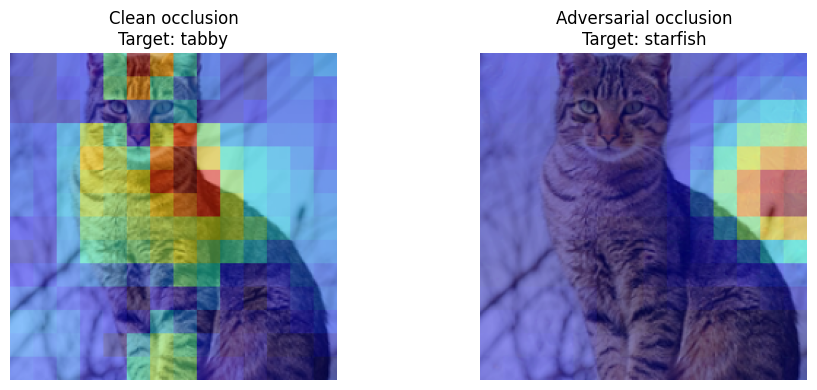

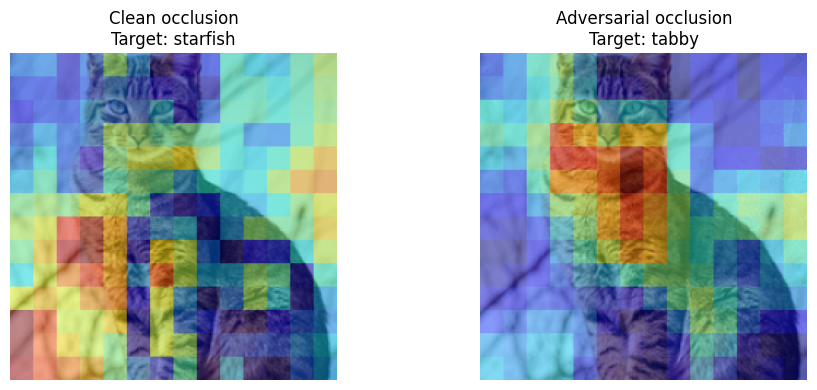

In [29]:
#clean_preds = predict_topk(model, clean_tensor, k=5)
#adv_preds = predict_topk(model, adv_tensor, k=5)

#clean_idx, clean_name = clean_preds[0][0], clean_preds[0][1]
#adv_idx, adv_name = adv_preds[0][0], adv_preds[0][1]

plot_two_occlusion_maps(
    clean_tensor,
    adv_tensor,
    clean_target=clean_idx,
    adv_target=adv_idx,
    clean_title=f"Clean occlusion\nTarget: {clean_name}",
    adv_title=f"Adversarial occlusion\nTarget: {adv_name}",
)

plot_two_occlusion_maps(
    clean_tensor,
    adv_tensor,
    clean_target=adv_idx,
    adv_target=clean_idx,
    clean_title=f"Clean occlusion\nTarget: {adv_name}",
    adv_title=f"Adversarial occlusion\nTarget: {clean_name}",
)

## Conclusion

In this notebook, we used three complementary tools to inspect a pretrained ResNet‑18. Hotspot maps showed **where** intermediate features respond strongly, activation maximization revealed **what patterns** a class or channel prefers, and occlusion maps highlighted **which image regions most influence** a prediction. 

Taken together, these methods give a more intuitive picture of the model’s internal behaviour. They do not fully explain the network, but they help relate its learned features to its predictions on both clean and adversarial images. 